# **Predicting the Sex of Abalone**

### Group 26: Joontae (Jay) Kim, Elisabeth Lau, Patricia Zhang, Jimmy Qi

## **Introduction**

Recently, the overexploitation of abalone has prompted strict regulations to ensure sustainability (Bullon et al., 2023). Analyzing abalone data can help evaluate the recovery potential of abalone populations (Boles et al., 2023), underscoring the critical role of understanding population dynamics through sex classification for effective conservation strategies.


We are using the Abalone dataset, originally created by Warwick Nash, Tracy Sellers, Simon Talbot, Andrew Cawthorn, and Wes Ford, from <a href = "https://doi.org/10.24432/C55C7W">UC Irvine’s Machine Learning Repository</a>. It includes variables of sex, length, diameter, height, number of rings, and the whole, shucked, viscera, and shell weight. The dataset has no missing values and includes the observation’s role(feature/target), type(continuous/integer) and description. This dataset also uses a tabular delimiter, allowing tasks such as classification and regression to answer our question.
to the abalone habitat (Nash et al., 1995).

The question we are addressing is: **How can we use the size measurements, particularly length, diameter, height, and total weight, to help us effectively predict the sex of abalone?**

## **Methods**

### **1.0 Preliminary exploratory data analysis**

To perform our data analysis, we first loaded the data from the original data from the public URL in our GitHub repository, since we couldn’t get a URL from the original source directly. From the downloaded raw data, we cleaned and wrangled the data by adding appropriate column names and making the Sex column observations into categorical factors, and renaming them to be “Male”, “Female”, and “Infant” instead of “M”, “F”, and “I” to be more readable and understandable as variables. We also filtered unwanted variables which were shucked weight, viscera weight, shell weight, and rings because the three weights are nondistinct, and already contribute to the whole weight variable. Additionally, the rings variable was also unused because it is irrelevant to predicting the sex of abalone. Our predictor variables were length, diameter, height, and whole weight, and response variable was sex. Then, we split the data into 75% training data and 25% testing data. 

Before beginning the data analysis portion of our project, we ensured to set the seed as one for all of our cells to ensure that data analysis is all reproducible. 

In [1]:
#Import packages that we will use
library(tidyverse)
library(cowplot)
library(scales)
library(GGally)
library(ggplot2)
library(tidymodels)

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Warning message:
“package ‘cowplot’ was built under R version 4.3.2”

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor


Warning message:
“package ‘GGally’ was built under R version 4.3.2

In [2]:
#Download and import the table using URL
set.seed(1)
url <- "https://raw.githubusercontent.com/werehappy/DSCI-Group-Project-26-/main/data/abalone.data"
download.file(url, "abalone_data.csv")
abalone_data <- read_delim("abalone_data.csv", delim = ",") #since there are no missing values, no need to remove with na.rm

Rows: 4176 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): M
dbl (8): 0.455, 0.365, 0.095, 0.514, 0.2245, 0.101, 0.15, 15

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [3]:
#Cleaning and wrangling data

#1. Add column names to the table
colnames(abalone_data) <- c("Sex", "Length", "Diameter", 
                      "Height", "Whole_weight", "Shucked_weight", "Visera_weight", "Shell_weight", "Rings")

#2. Filter out unwanted variables and factorise Sex column
abalone_filtered_fct <- abalone_data |> mutate(Sex = as_factor(Sex)) |> 
mutate(Sex = fct_recode(Sex, "Male" = "M", "Female" = "F", "Infant" = "I")) |> select(Sex:Whole_weight)
print("Table 1: Cleaned and Wrangled Data")
head(abalone_filtered_fct)

[1] "Table 1: Cleaned and Wrangled Data"


Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.350,0.265,0.090,0.2255
Female,0.530,0.420,0.135,0.6770
Male,0.440,0.365,0.125,0.5160
Infant,0.330,0.255,0.080,0.2050
Infant,0.425,0.300,0.095,0.3515
Female,0.530,0.415,0.150,0.7775


In [4]:
#Splitting the table with 75% of training and 25% of testing
abalone_split <- initial_split(abalone_filtered_fct, prop = 0.75, strata = Sex)
abalone_train <- training(abalone_split) 
abalone_test <- testing(abalone_split)

print("Table 2: Training Data")
head(abalone_train)

[1] "Table 2: Training Data"


Sex,Length,Diameter,Height,Whole_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Female,0.545,0.425,0.125,0.7680
Female,0.525,0.380,0.140,0.6065
Female,0.535,0.405,0.145,0.6845
Female,0.470,0.355,0.100,0.4755
Female,0.440,0.340,0.100,0.4510
Female,0.615,0.480,0.165,1.1615


### 1.1 Visualizing the training data


After splitting the data into 75% training data and 25% testing data, we visualized the relationship between each predictor variable in the training data, using the ggpairs function. This created visualizations of box plots, bar graphs, histograms, area graphs, and scatter plots. 

As seen by the boxplots and area graphs, females seem to have slightly larger physical characteristics than males and visibly more than infants across plots. This shows the relationship between the abalone sex and chosen physical features that we will use for predicting sex.

**Note**: The scatterplots are least useful in visualizing the differences between the categorical points because the numerous overlapping points are difficult to read. The histograms are also difficult to compare between classes.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


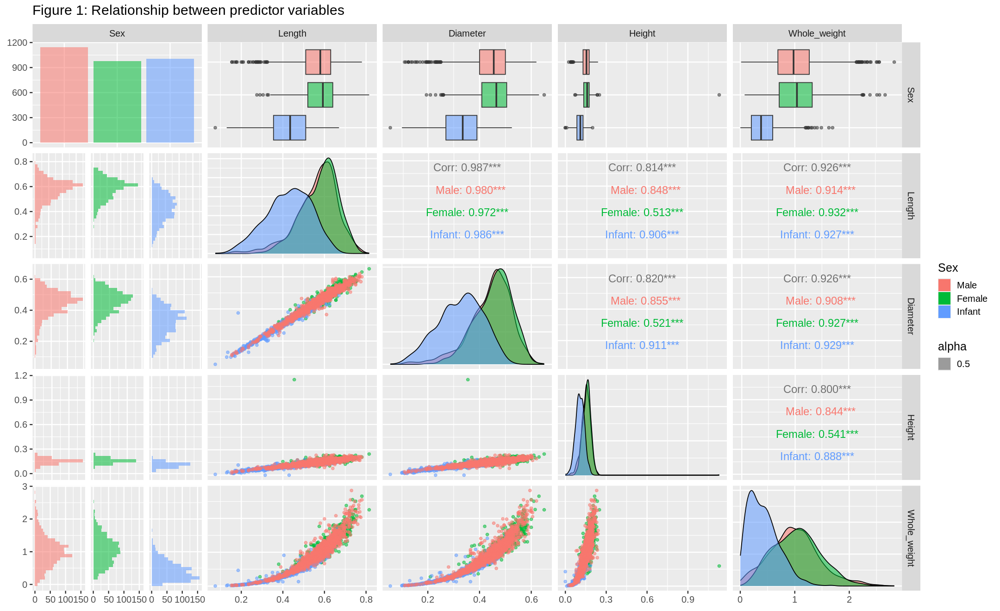

In [5]:
#Visualise the relationship between each of our predictor variables in the training data using the ggpairs function
options(repr.plot.width = 18, repr.plot.height = 11)
ggpairs(abalone_train, 
        columns = 1:5, 
        ggplot2::aes(color = Sex , alpha = 0.5),
        legend = 1,
        upper = list(continuous = wrap("cor", size = 5)),
        labs(fill = "Sex")) + 
    ggtitle("Figure 1: Relationship between predictor variables") +
    theme(title = element_text(size = 15)) +
    theme_grey(base_size = 15)

### 1.2 Summarizing the training data

Next, to perform a summary of the training data, we summarized the mean, median, and range (maximum and minimum) of each predictor variable in the training set, grouped by our response variable, sex. Among all summaries, we found that females had the highest values across mean, median, minimum, and maximum of all predictor variables, and infants had the lowest. While infants had a clear difference compared to males and females, however, the females and males had a slight difference between their numerical summary values. 

In [6]:
#Summarising the total number of observations for each class (sex - male, female, infant)
abalone_proportions <- abalone_train |>
                      group_by(Sex) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(abalone_train))
print("Table 3: Total number of observations for each class")
abalone_proportions

[1] "Table 3: Total number of observations for each class"


Sex,n,percent
<fct>,<int>,<dbl>
Male,1145,36.56979
Female,980,31.29990
Infant,1006,32.13031


In [7]:
#Summarising mean, median, and range of length predictor variable
length_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_length = mean(Length), median_length = median(Length), min_length = min(Length), max_length = max(Length))
print("Table 4: Summary of length for each class")
length_summary

[1] "Table 4: Summary of length for each class"


Sex,mean_length,median_length,min_length,max_length
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.5638472,0.5800,0.155,0.780
Female,0.5792908,0.5925,0.275,0.815
Infant,0.4273807,0.4350,0.075,0.670


In [8]:
#Summarising mean, median, and range of diameter predictor variable
diameter_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_diameter = mean(Diameter), median_diameter = median(Diameter), min_diameter = min(Diameter), max_diameter = max(Diameter))
print("Table 5: Summary of diameter for each class")
diameter_summary

[1] "Table 5: Summary of diameter for each class"


Sex,mean_diameter,median_diameter,min_diameter,max_diameter
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.4414541,0.455,0.110,0.620
Female,0.4549796,0.465,0.195,0.650
Infant,0.3260835,0.335,0.055,0.525


In [9]:
#Summarising mean, median, and range of height predictor variable
height_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_height = mean(Height), median_height = median(Height), min_height = min(Height), max_height = max(Height))
print("Table 6: Summary of height for each class")
height_summary

[1] "Table 6: Summary of height for each class"


Sex,mean_height,median_height,min_height,max_height
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.1515939,0.155,0.025,0.24
Female,0.1582398,0.160,0.070,1.13
Infant,0.1075497,0.110,0.000,0.20


In [10]:
#Summarising mean, median, and range of weight predictor variable
weight_summary <- abalone_train |>
    group_by(Sex) |>
    summarize(mean_weight = mean(Whole_weight), median_height = median(Whole_weight), min_weight = min(Whole_weight), max_weight = max(Whole_weight))
print("Table 7: Summary of height for each class")
weight_summary

[1] "Table 7: Summary of height for each class"


Sex,mean_weight,median_height,min_weight,max_weight
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Male,0.9999336,0.9780,0.0155,2.8255
Female,1.0459429,1.0400,0.0800,2.6570
Infant,0.4274443,0.3815,0.0020,1.6935


### **2. Data Analysis** ###

### 2.0 Calculating proportions

First, we calculated the proportions of sex in our abalone data to understand if one sex would be more representative than others. Luckily, the proportions between the three sexes were between 31-36%, which is quite even. 

In [11]:
#Calculate the proportions for abalone with different sex
set.seed(1)
abalone_proportions <- abalone_train |>
                      group_by(Sex) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(abalone_train))

print("Table 8: Proportion of each sex in data")
abalone_proportions

[1] "Table 8: Proportion of each sex in data"


Sex,n,percent
<fct>,<int>,<dbl>
Male,1145,36.56979
Female,980,31.29990
Infant,1006,32.13031


### 2.1 Preprocessing - test accuracy of random K

To preprocess our data, we created a recipe with our response and predictor variables in the training data, and standardized and centred the data. Then, we created a model that used KNN classification. To first test the accuracy of a random K that we choose, we chose 5 neighbours for the K value. We put the recipe and model into a workflow, fitting the data to the training data. Then, to get the accuracy of our fitted model with a K value of 5 on the testing data, we used the predict function to first get the predictions from the testing data based on the model we just fitted. After, the accuracy was computed using the accuracy evaluation metric, using the metrics function and specifying hte truth and estimate arguments. We found that with a K value of 5, the accuracy of our prediction model is **50.71%**, prediction was 50.39%, and recall was 50.88%. To see if the accuracy can be improved by optimizing our K-value, we then performed cross validation later. 

In [12]:
#Create a recipe for knn classification prediction
set.seed(1)
abalone_recipe <- recipe(Sex ~ Length + Diameter + Height + Whole_weight, data = abalone_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

In [13]:
#K-NN classification processes
set.seed(1)

#Make classification model
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 5) |>
  set_engine("kknn") |>
  set_mode("classification")

#Train model in workflow
knn_fit <- workflow() |>
  add_recipe(abalone_recipe) |>
  add_model(knn_spec) |>
  fit(data = abalone_train)

knn_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(5,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.4940913
Best kernel: rectangular
Best k: 5

In [14]:
#Check the prediction
set.seed(1)
abalone_test_predictions <- predict(knn_fit, abalone_test) |>
  bind_cols(abalone_test)

print("Table 9: Prediction accuracy of K = 5")
head(abalone_test_predictions)

[1] "Table 9: Prediction accuracy of K = 5"


.pred_class,Sex,Length,Diameter,Height,Whole_weight
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Infant,Female,0.530,0.420,0.135,0.6770
Infant,Infant,0.425,0.300,0.095,0.3515
Female,Female,0.530,0.415,0.150,0.7775
Female,Female,0.550,0.440,0.150,0.8945
Infant,Male,0.450,0.320,0.100,0.3810
Infant,Male,0.355,0.280,0.095,0.2455


In [15]:
#Show accuracy
set.seed(1)
print("Accuracy for K = 5:")
abalone_test_predictions |>
  metrics(truth = Sex, estimate = .pred_class) |>
  filter(.metric == "accuracy") |>
  select(.estimate) |>
  pull()

[1] "Accuracy for K = 5:"


[1] 0.507177

In [16]:
#Show precision
set.seed(1)
print("Precision for K = 5:")
abalone_test_predictions |>
  precision(truth = Sex, estimate = .pred_class, event_level = "first") |>
  filter(.metric == "precision") |>
  select(.estimate) |>
  pull()

[1] "Precision for K = 5:"


[1] 0.5039307

In [17]:
#Show recall
set.seed(1)
print("Recall for K = 5:")
abalone_test_predictions |>
  recall(truth = Sex, estimate = .pred_class, event_level = "first") |>
  filter(.metric == "recall") |>
  select(.estimate) |>
  pull()

[1] "Recall for K = 5:"


[1] 0.5088707

In [18]:
#confusion matrix
set.seed(1)
confusion <- abalone_test_predictions |>
             conf_mat(truth = Sex, estimate = .pred_class)
print("Figure 2: Confusion Matrix for K = 5")
confusion

#Using this Value, calculate the accuracy, precision, and recall

[1] "Figure 2: Confusion Matrix for K = 5"


          Truth
Prediction Male Female Infant
    Male    170    161     59
    Female  130    124     41
    Infant   82     42    236

### 2.2 Data Analysis with tuned K

To improve and tune our K-NN classifier, we used the 10-fold cross-validation on the training set, splitting our data into 10 folds automatically and ensuring that the training and validation subsets contain the right proportions of each category of observation. We chose 10 folds because our data is larger and has multiple predictors. 

First validation set

Then, we put that into a workflow; however, rather than fitting it directly with the training data, we ran cross-validation on each train/validation split.

we fit it the model for each value in a range of parameter values. In particular, we created a data frame with a neighbors variable that contains the sequence of values of K to try, which are values from 1 to 100, stepping by 5 using the seq function. Then we passed that data frame to the grid argument of tune_grid and collected the metrics. Performing this cross-validation helps us evaluate the accuracy of our classifier. To calculate our accuracy for each K value, we plotted the accuracy values for each K in a line plot–finding that the value with the highest accuracy is a K value of 51. 

In [19]:
set.seed(1)
# create the 25/75 split of the training data into training and validation
abalone_split2 <- initial_split(abalone_train, prop = 0.75, strata = Sex)
abalone_subtrain <- training(abalone_split2)
abalone_validation <- testing(abalone_split2)

# recreate the standardization recipe from before
# (since it must be based on the training data)
abalone_recipe2 <- recipe(Sex ~ Length + Diameter + Height + Whole_weight, data = abalone_subtrain) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

# fit the knn model (we can reuse the old knn_spec model from before)
knn_fit <- workflow() |>
  add_recipe(abalone_recipe2) |>
  add_model(knn_spec) |>
  fit(data = abalone_subtrain)

# get predictions on the validation data
validation_predicted <- predict(knn_fit, abalone_validation) |>
  bind_cols(abalone_validation)

# compute the accuracy
acc <- validation_predicted |>
  metrics(truth = Sex, estimate = .pred_class) |>
  filter(.metric == "accuracy") |>
  select(.estimate) |>
  pull()

acc

[1] 0.5191327

In [20]:
set.seed(1)

#perform 10-fold cross validation
abalone_vfold <- vfold_cv(abalone_train, v = 10, strata = Sex)

In [21]:
set.seed(1)
# recreate the standardization recipe from before
# (since it must be based on the training data)
abalone_recipe <- recipe(Sex ~ Length + Diameter + Height + Whole_weight, data = abalone_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

# fit the knn model (we can reuse the old knn_spec model from before)
knn_fit <- workflow() |>
  add_recipe(abalone_recipe) |>
  add_model(knn_spec) |>
  fit_resamples(resamples = abalone_vfold)

In [22]:
set.seed(1)
print("Table 10: Accuracy and ROC of 10 fold cross validation")

knn_fit |>
  collect_metrics()

[1] "Table 10: Accuracy and ROC of 10 fold cross validation"


.metric,.estimator,mean,n,std_err,.config
<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
accuracy,multiclass,0.5123035,10,0.009669654,Preprocessor1_Model1
roc_auc,hand_till,0.7013571,10,0.005939961,Preprocessor1_Model1


In [23]:
set.seed(1)

# tune the model
knn_spec_tune <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
  set_engine("kknn") |>
  set_mode("classification")

### 2.3 Finding the best K

Now that we know the most accurate K value, we reperformed the preprocessing steps again, using the same scaled and centered recipe from our training data and appropriate response and predictor variables, recreating the K-NN classification model with the best K value, 26, and putting the model and recipe into a workflow fitted to the training data again. 

In [24]:
set.seed(1)
#Method to find the best K
k_vals <- tibble(neighbors = seq(from = 1, to = 100, by = 5))

knn_results <- workflow() |>
  add_recipe(abalone_recipe) |>
  add_model(knn_spec_tune) |>
  tune_grid(resamples = abalone_vfold, grid = k_vals) |>
  collect_metrics()

accuracies <- knn_results |>
  filter(.metric == "accuracy")

print("Table 11: Accuracies for values of K 1 to 100, increasing by 5")
accuracies

[1] "Table 11: Accuracies for values of K 1 to 100, increasing by 5"


neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,multiclass,0.4902545,10,0.006070707,Preprocessor1_Model01
6,accuracy,multiclass,0.5135804,10,0.007671992,Preprocessor1_Model02
11,accuracy,multiclass,0.5378322,10,0.007920807,Preprocessor1_Model03
16,accuracy,multiclass,0.5285629,10,0.005220196,Preprocessor1_Model04
21,accuracy,multiclass,0.5343066,10,0.008248281,Preprocessor1_Model05
26,accuracy,multiclass,0.5381405,10,0.006552617,Preprocessor1_Model06
31,accuracy,multiclass,0.5387795,10,0.006502723,Preprocessor1_Model07
36,accuracy,multiclass,0.5378261,10,0.007480931,Preprocessor1_Model08
41,accuracy,multiclass,0.5419631,10,0.007077250,Preprocessor1_Model09


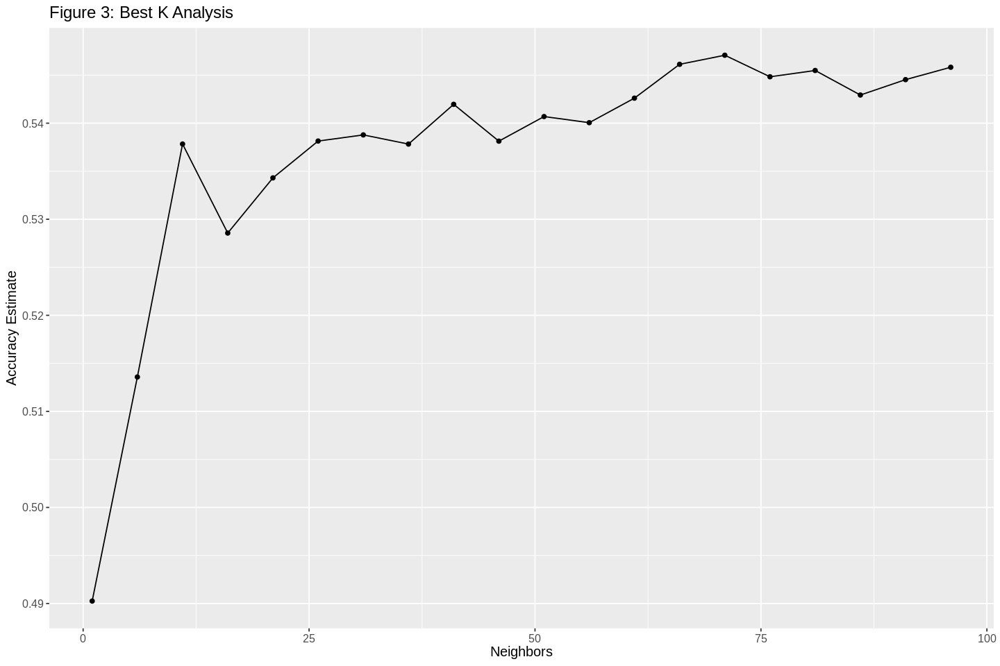

In [25]:
set.seed(1)
options(repr.plot.width = 12, repr.plot.height = 8)

#Show graph for the best K
accuracy_vs_k <- ggplot(accuracies, aes(x = neighbors, y = mean)) +
  geom_point() +
  geom_line() +
  labs(x = "Neighbors", y = "Accuracy Estimate") +
  ggtitle("Figure 3: Best K Analysis") +
  theme(text = element_text(size = 12))

accuracy_vs_k

In [26]:
set.seed(1)
#Show best K
best_k <- accuracies |>
        arrange(desc(mean)) |>
        head(1) |>
        pull(neighbors)
print("Best K value: ")
best_k

[1] "Best K value: "


[1] 71

In [27]:
set.seed(1)
#Use best K to train finally
cancer_recipe <- recipe(Sex ~ Length + Diameter + Height + Whole_weight, data = abalone_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = best_k) |>
  set_engine("kknn") |>
  set_mode("classification")

knn_fit <- workflow() |>
  add_recipe(abalone_recipe) |>
  add_model(knn_spec) |>
  fit(data = abalone_train)

knn_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(71,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.4528905
Best kernel: rectangular
Best k: 71

### Model Evaluation ###

To check the prediction, we tested the prediction model using the workflow we created on the testing data we split before. We determined the accuracy to evaluate the mode’s prediction performance against the testing data by using the accuracy evaluation metric—which also helped confirm which and how many predictors lead to the optimal accuracy. We found that the accuracy of our model was 55.31%, higher than our initially randomly-chosen K value of 5. We also determined the precision and recal of our model using the appropriate functions, finding that it is 53.68% precise and has a recall of 55.28%. 
We also used a confusion matrix to define the performance of our classification model, finding that males and females are much closer in value in truth and prediction, while infant is more distinct. Therefore, infants are more predictable, while males and females are more difficult to predict. 

In [28]:
set.seed(1)
abalone_test_predictions <- predict(knn_fit, abalone_test) |>
  bind_cols(abalone_test)

print("Accuracy for best K, K = 26")
abalone_test_predictions |>
  metrics(truth = Sex, estimate = .pred_class) |>
  filter(.metric == "accuracy") |>
  select(.estimate) |>
  pull()

[1] "Accuracy for best K, K = 26"


[1] 0.5416268

In [29]:
set.seed(1)
print("Precision for best K, K = 26")
abalone_test_predictions |>
    precision(truth = Sex, estimate = .pred_class, event_level="first") |>
    filter(.metric == "precision") |>
    select(.estimate) |>
    pull()

[1] "Precision for best K, K = 26"


[1] 0.5305275

In [30]:
set.seed(1)
print("Recall for best K, K = 26")
abalone_test_predictions |>
    recall(truth = Sex, estimate = .pred_class, event_level="first") |>
    filter(.metric == "recall") |>
    select(.estimate) |>
    pull()

[1] "Recall for best K, K = 26"


[1] 0.541339

In [31]:
set.seed(1)
confusion <- abalone_test_predictions |>
             conf_mat(truth = Sex, estimate = .pred_class)
print("Figure 4: Confusion Matrix for K=26")
confusion

[1] "Figure 4: Confusion Matrix for K=26"


          Truth
Prediction Male Female Infant
    Male    191    174     47
    Female   91     97     11
    Infant  100     56    278

## Visualizing the Results ##

Finally, we visualized the prediction of our test data by comparing the number of correct predictions (brighter colour) and incorrect predictions (darker colour) in a confusion matrix heatmap. This helped us understand where the classifier is making errors in predicting the abalone sex, and visualize the correlation between multiple physical features, finding that infants have the highest prediction accuracy, as it is the lightest colour blue, and the rest are dark. 

Rows: 3 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: " "
chr (1): Truth
dbl (3): Male, Female, Infant

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Truth,Male,Female,Infant
<chr>,<dbl>,<dbl>,<dbl>
Male,178,161,40
Female,106,100,7
Infant,98,66,289


Truth,Prediction,value
<chr>,<chr>,<dbl>
Male,Male,178
Female,Male,106
Infant,Male,98
Male,Female,161
Female,Female,100
Infant,Female,66
Male,Infant,40
Female,Infant,7
Infant,Infant,289


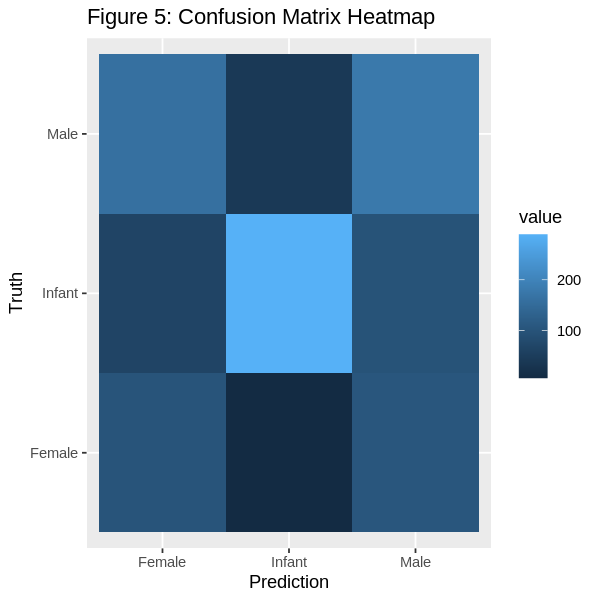

In [32]:
hm <- readr::read_delim("Truth Male Female Infant
Male 178 161 40
Female 106 100 7
Infant 98 66 289", delim=" ")
hm

hm <- hm %>% gather(Prediction, value, Male, Female, Infant)
hm

options(repr.plot.width = 5, repr.plot.height = 5)
ggplot(hm, aes(x=Prediction, y=Truth, fill=value)) + geom_tile() + ggtitle("Figure 5: Confusion Matrix Heatmap")

#Code reference: https://stackoverflow.com/questions/7421503/how-to-plot-a-confusion-matrix-using-heatmaps-in-r

## **Discussion**

To start, we found out that generally, female abalones have slightly larger length, diameter, height, and total weight when compared to male and infant abalones. We also found out that through using variables such as length, diameter, height, and total weight, we can reach an accuracy of 55.311%, a recall of 55.28103% and a precision of 53.67587% when determining the sexes of abalones through using the length, diameter, height, and total weight of abalones. Henceforth, demonstrating that only using these variables of abalones to determine their sex will only be somewhat accurate. 



We expected to find that female abalones would usually be bigger than male abalones, due to sexual dimorphism; as according to the scientific journal, “Allometry for Sexual Size Dimorphism: Pattern and Process in the Coevolution of Body Size in Males and Females,”  researcher states that “ female-biased sexual size dimorphism predominates among invertebrates and poikilothermic vertebrates” (D.J.Fairbairn, 1997). Thus, we expected female abalones to be slightly bigger than male abalones. Likewise, the relatively low accuracy, precision and recall is also somewhat expected, as most abalones’ sizes tend to be quite similar to each other, regardless of their gender. For example, on the ggpairs graphs, a majority of the plots show a heavy overlap between female and male physical attributes. Consequently, it is sensible that our model would have a relative low accuracy, precision, and recall. Additionally, this is also shown by the confusion matrix, as the model would often mispredict between male and female abalones. Nevertheless, our model is quite good at predicting whether or not an abalone is an infant. Hence, it is not a surprise that it would be difficult to predict the sex of abalones based on their physical attributes.



These findings likely have an impact on abalone conservation, as it shows that using physical attributes alone is not a definitive means of determining abalones’ sexes. Henceforth, this finding can demonstrate that researchers would often need more than just physical measurements when determining the sex of abalones. Likewise, our finding can also be applied in other fields that require the documentation of abalone sexes, namely the abalone fishing industry, in order to show that physical size can only give a rough estimate of the abalone’s sex. 


Future Questions:
1. One question that our findings could lead to would undoubtedly be “What other characteristics of abalones can also be used in order to increase the accuracy of our model?
2. How does abalone sex affect the way abalones grow? 
3. Are there other characteristics of abalone such as measurable behaviours or other ecological factors affect the size of abalone


## **References**

Boles, S. E., Rogers-Bennett, L., Bragg, W. K., Bredvik-Curran, J., Graham, S., & Gross, J. A. (2023). Determination of gonad reproductive state using non-lethal ultrasonography in endangered black (Haliotis cracherodii) and white abalone (H. Sorenseni). Frontiers in Marine Science, 10. https://doi.org/10.3389/fmars.2023.1134844 44

Bullon, N., Seyfoddin, A., & Alfaro, A. C. (2023). The role of aquafeeds in abalone nutrition and health: A comprehensive review. Journal of the World Aquaculture Society, 54(1), 7–31. https://doi.org/10.1111/jwas.12883

Fairbairn, D. J. (1997). Allometry for Sexual Size Dimorphism: Pattern and Process in the Coevolution of Body Size in Males and Females. Annual Review of Ecology and Systematics, 28, 659–687. http://www.jstor.org/stable/2952508

Nash, W., Sellers, T., Talbot, S., Cawthorn, A., and Ford, W. (1995). Abalone. UCI Machine Learning Repository. https://doi.org/10.24432/C55C7W.

Stierhoff, K. L., Neuman, M., & Butler, J. L. (2012). On the road to extinction? population declines of the endangered white abalone, Haliotis sorenseni. Biological Conservation, 152, 46–52. https://doi.org/10.1016/j.biocon.2012.03.013 
